<a href="https://colab.research.google.com/github/Ppangchon/project/blob/main/bears.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Image classification*

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
# นำเข้า TensorFlow 
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
from google.colab import drive # เชื่อม drive ของเรา ถ้าเชื่อมสำเร็จจะขึ้นคำว่าMounted at /content/drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/My Drive/Test code/bears'  # ชี้ว่า data เราอยู่โฟล์เดอร์ไหน

# Download and Explore dataset

In [ ]:
import pathlib
data_dir = pathlib.Path('/content/drive/My Drive/Test code/bears')

In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)  # มีรูปภาพทั้งหมด 42 รูป

42


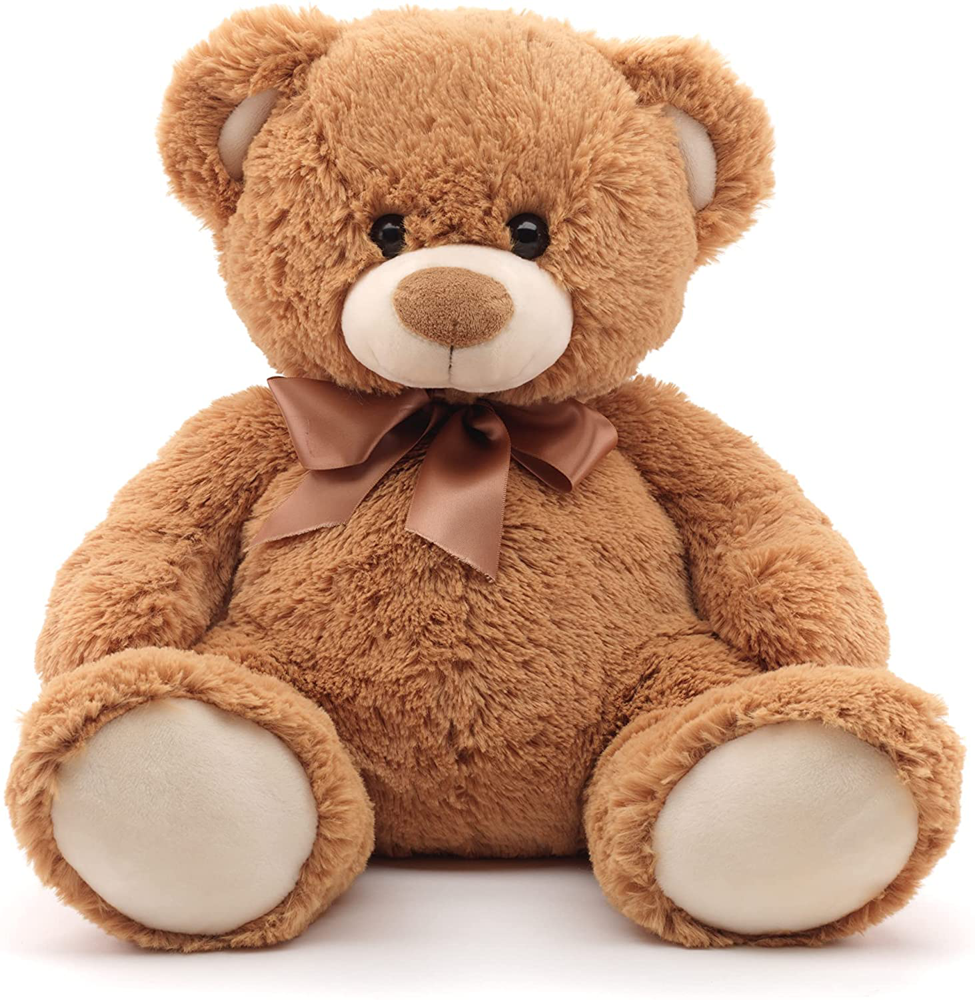

In [ ]:
teddys = list(data_dir.glob('teddys/*'))
PIL.Image.open(str(teddys[0]))

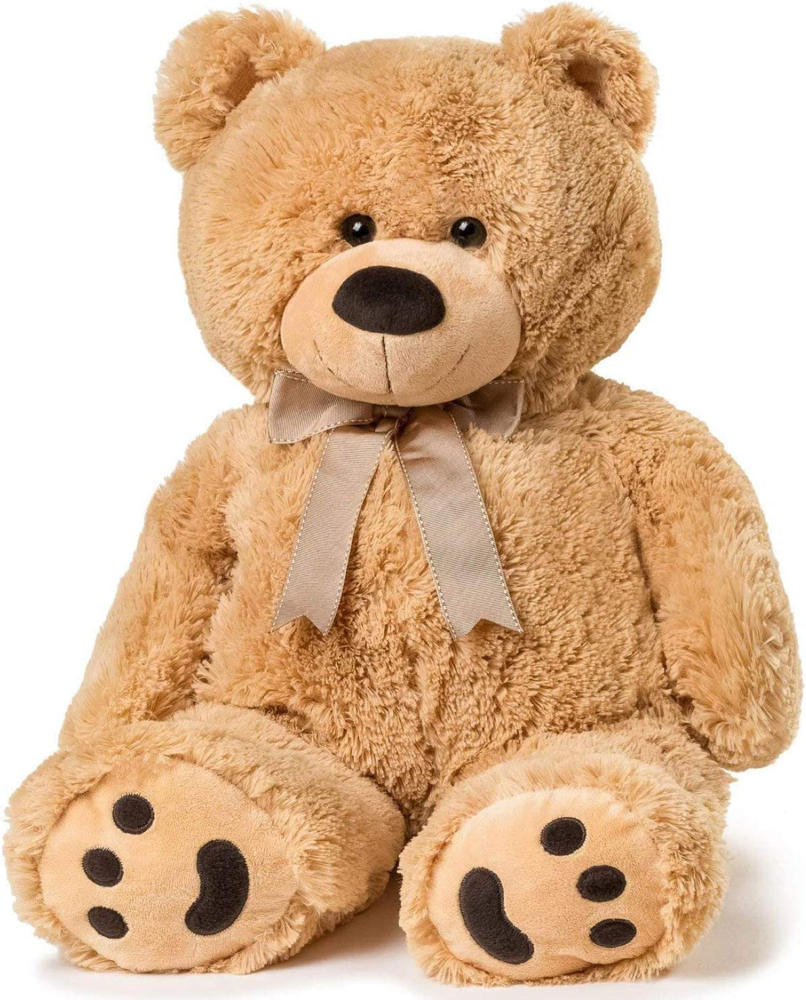

In [ ]:
PIL.Image.open(str(teddys[1]))

And some grizzly:

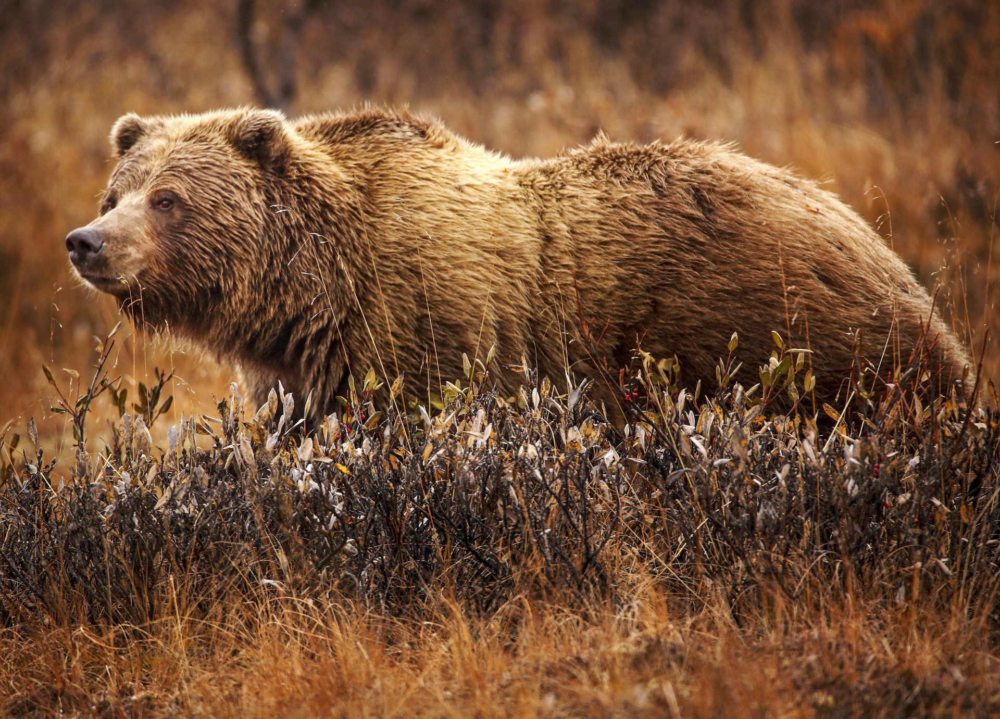

In [ ]:
grizzly = list(data_dir.glob('grizzly/*'))
PIL.Image.open(str(grizzly[0]))

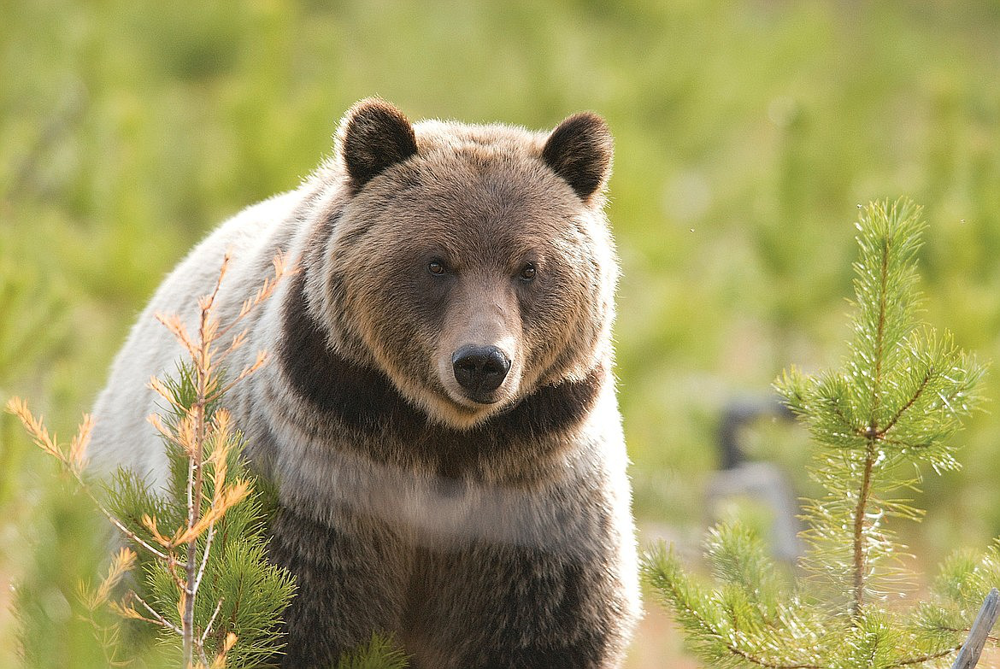

In [ ]:
PIL.Image.open(str(grizzly[2]))

กำหนดพารามิเตอร์ :

ขนาดของ Batch คือจำนวนรายการข้อมูลที่จะให้ Optimiser คำนวนในหนึ่งครั้ง

In [ ]:
batch_size = 30   
img_height = 180
img_width = 180

validation split ข้อมูลชุดที่โมเดลไม่เคยเห็น Keras จะคำนวน Loss และความแม่นยำกับ Validation set ทุกครั้งที่คำนวนจบ 1 Epoch

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.4,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 42 files belonging to 3 classes.
Using 26 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.4,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 42 files belonging to 3 classes.
Using 16 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['black bear', 'grizzly', 'teddys']


## Visualize the data



In [ ]:
import matplotlib.pyplot as plt
